In [1]:
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import torch
import glob
import random
from tqdm import tqdm
import shutil
from sklearn.model_selection import KFold

In [22]:
model_path = '/media/rohit/mirlproject2/fetal head circumference/1segmented-images/image-segmentation-yolov8-main/runs/detect/train/weights/best.pt'
model = YOLO(model_path)

im = cv2.imread("/media/rohit/mirlproject2/fetal head circumference/1segmented-images/train/imgs/2e86a9ba-6d50-4748-8a2b-8dd2c872220b.jpg")

results = model(im)

for result in results:
    print(result.boxes.data)


tensor([[310.6357, 134.2026, 444.0906, 254.8045,   0.9260,   0.0000],
        [200.8367,  39.2076, 296.6108, 141.3479,   0.7738,   0.0000]], device='cuda:0')


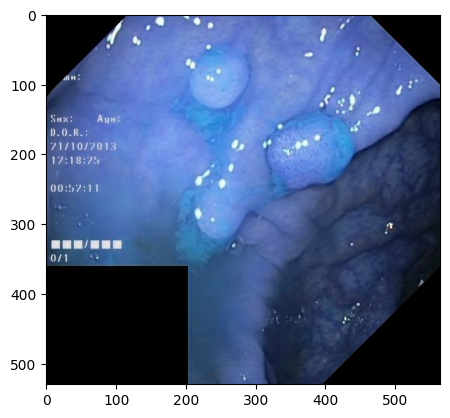

In [23]:
plt.imshow(result.orig_img)

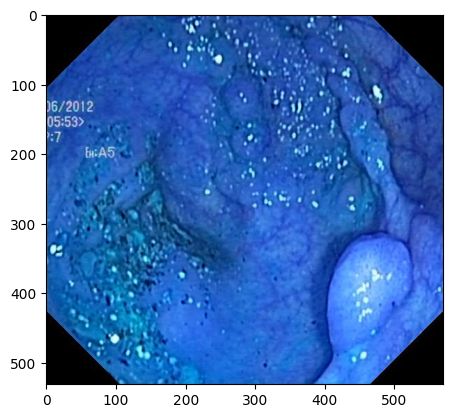

In [10]:
plt.imshow(im)

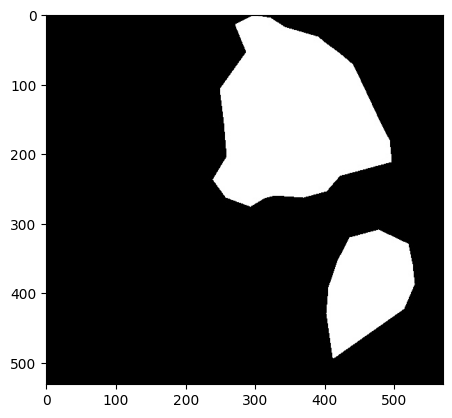

In [13]:
mask = cv2.imread("/media/rohit/mirlproject2/fetal head circumference/1segmented-images/val/masks/e9f9891a-154b-4581-be44-402b7630d323.jpg")
plt.imshow(mask)

In [14]:
bbox_coords_val_1

{'44f1fdae-e11d-4b6d-ada2-548aca00ffdf': array([  1, 137, 329, 529])}

In [ ]:
ground_truth_masks = {}
for k in bbox_coords.keys():
  gt_grayscale = cv2.imread('/media/rohit/mirlproject2/fetal head circumference/1segmented-images/train/masks/'+k+'.jpg', cv2.IMREAD_GRAYSCALE)
  ground_truth_masks[k] = (gt_grayscale == 255)

In [ ]:
ground_truth_masks_val = {}
for k in bbox_coords_val.keys():
  gt_grayscale = cv2.imread(f'/media/rohit/mirlproject2/fetal head circumference/1segmented-images/val/masks/{k}.jpg', cv2.IMREAD_GRAYSCALE)
  ground_truth_masks_val[k] = (gt_grayscale == 255)

In [15]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))

In [16]:
bbox_coords_val_1

{'44f1fdae-e11d-4b6d-ada2-548aca00ffdf': array([  1, 137, 329, 529])}

In [3]:
len(bbox_coords_val_1)

49

In [5]:
bbox_coords_val_1['e9f9891a-154b-4581-be44-402b7630d323.jpg']

array([396, 309, 531, 490])

  0%|          | 0/950 [00:00<?, ?it/s]

tensor([[2.9407e+02, 5.7510e+02, 6.9545e+02, 9.7258e+02, 9.3906e-01, 0.0000e+00],
        [3.9790e+02, 1.8766e+02, 7.3727e+02, 4.9058e+02, 9.2051e-01, 0.0000e+00]], device='cuda:0')
294 575 695 972
[294 575 695 972]
397 187 737 490
[397 187 737 490]


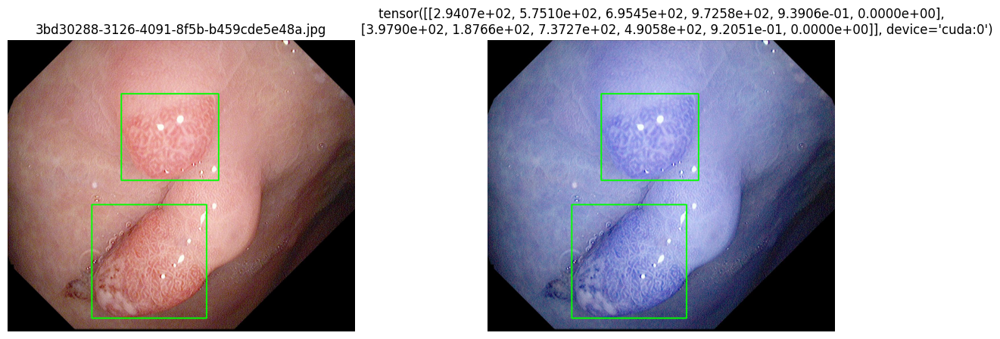

3bd30288-3126-4091-8f5b-b459cde5e48a.jpg
bbox_coords_val_1: [397 187 737 490]


In [5]:
from ultralytics import YOLO

import cv2

import matplotlib.pyplot as plt
import os
import numpy as np

import logging
logging.getLogger('ultralytics').setLevel(logging.ERROR)  # Suppress messages below ERROR level

import sys
import glob

from tqdm.notebook import tqdm


def is_inside(inner, outer):
    return all([
        inner[0] >= outer[0],  # Inner box's left edge is right of the outer box's left edge
        inner[1] >= outer[1],  # Inner box's top edge is below the outer box's top edge
        inner[2] <= outer[2],  # Inner box's right edge is left of the outer box's right edge
        inner[3] <= outer[3],  # Inner box's bottom edge is above the outer box's bottom edge
    ])

def filter_boxes(boxes):

    filtered_boxes = []

    for i, box in enumerate(boxes):
        # Check if this box is inside any other box
        if not any(is_inside(box, boxes[j]) for j in range(len(boxes)) if i != j):
            filtered_boxes.append(box)

    return filtered_boxes

# Update your draw_box function to use filter_boxes
def draw_box(img, boxes):
    boxes = filter_boxes(boxes)  # Filter boxes to remove inner boxes
    for box in boxes:
        x1, y1, x2, y2 = map(int, box[:4])
        print(x1,y1,x2,y2)
        coordinates=np.array([x1,y1,x2,y2])
        print(coordinates)
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 3)
    return img,coordinates


#img=cv2.imread('/media/rohit/mirlproject2/fetal head circumference/1segmented-images/image-segmentation-yolov8-main/data/images/val/c1f938cc-d902-4ced-bbb5-fcdf3eb991d3.jpg')
model_path = '/media/rohit/mirlproject2/fetal head circumference/1segmented-images/image-segmentation-yolov8-main/runs/detect/train/weights/best.pt'

image_paths = glob.glob('/media/rohit/mirlproject2/fetal head circumference/1segmented-images/image-segmentation-yolov8-main/data/images/train/*')

#image_folder_sorted = natsorted(image_paths, key=lambda x: int(re.findall(r'frame_(\d+).jpg', x)[0]))

image_folder_sorted=sorted(image_paths)

model = YOLO(model_path)

bbox_coords_val_1={}


for image_path in tqdm(image_folder_sorted):

    if os.path.basename(image_path)!= '3bd30288-3126-4091-8f5b-b459cde5e48a.jpg':
        continue

    img = cv2.imread(image_path)
    results = model(img)

    for result in results:
        if result.boxes is not None:
          print(result.boxes.data)
          img_with_boxes,coordinates = draw_box(img, result.boxes.data)
          #bbox_coords_val_1[os.path.basename(image_path)] = coordinates


    fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    axs[0].imshow(cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB), cmap='gray')
    axs[0].set_title(os.path.basename(image_path))
    axs[1].imshow(result.orig_img, cmap='gray')
    axs[1].set_title(str(result.boxes.data))

    for ax in axs:
        ax.axis('off')

    plt.show()

    print(os.path.basename(image_path))
    print(f'bbox_coords_val_1: {coordinates}')

  0%|          | 0/950 [00:00<?, ?it/s]

tensor([[2.9407e+02, 5.7510e+02, 6.9545e+02, 9.7258e+02, 9.3906e-01, 0.0000e+00],
        [3.9790e+02, 1.8766e+02, 7.3727e+02, 4.9058e+02, 9.2051e-01, 0.0000e+00]], device='cuda:0')
294 575 695 972
[294 575 695 972]
397 187 737 490
[397 187 737 490]


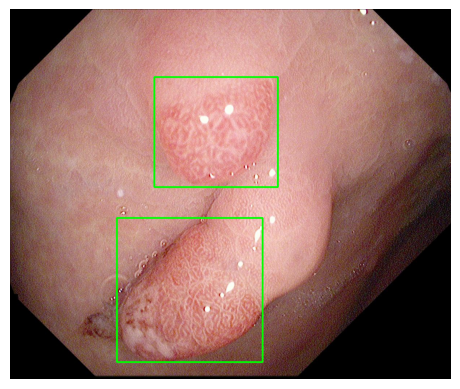

In [6]:
for image_path in tqdm(image_folder_sorted):

    if os.path.basename(image_path)!= '3bd30288-3126-4091-8f5b-b459cde5e48a.jpg':
        continue

    img = cv2.imread(image_path)
    results = model(img)

    for result in results:
        if result.boxes is not None:
          print(result.boxes.data)
          img_with_boxes,coordinates = draw_box(img, result.boxes.data)
          #bbox_coords_val_1[os.path.basename(image_path)] = coordinates


    plt.imshow(cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB), cmap='gray')

    plt.axis('off')

    plt.show()

In [122]:
result.boxes.data

tensor([[ 32.5180,  10.0936, 367.8329, 514.7064,   0.7895,   0.0000],
        [ 32.1145,   9.3954, 367.2230, 350.5563,   0.7599,   0.0000],
        [ 27.4767,   6.3026, 560.0400, 527.4208,   0.6722,   0.0000]], device='cuda:0')

In [123]:
filter_boxes(result.boxes.data)

[tensor([ 27.4767,   6.3026, 560.0400, 527.4208,   0.6722,   0.0000], device='cuda:0')]

In [124]:
np_array = result.boxes.data.cpu().numpy()[:, :4]
np_array

array([[     32.518,      10.094,      367.83,      514.71],
       [     32.115,      9.3954,      367.22,      350.56],
       [     27.477,      6.3026,      560.04,      527.42]], dtype=float32)

In [125]:
np_array=filter_boxes(np_array)
np_array

[array([     27.477,      6.3026,      560.04,      527.42], dtype=float32)]

In [90]:
a

array([[200,  39, 296, 141],
       [310, 134, 444, 254]])

# SAM

In [27]:
import torch
torch.cuda.is_available()

True

In [25]:
model_type = 'vit_h'
checkpoint = './sam_vit_h_4b8939.pth'
device = 'cuda'

In [28]:
from segment_anything import SamPredictor, sam_model_registry
sam_model = sam_model_registry[model_type](checkpoint=checkpoint)
predictor = SamPredictor(sam_model)
sam_model.to(device)

Sam(
  (image_encoder): ImageEncoderViT(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 1280, kernel_size=(16, 16), stride=(16, 16))
    )
    (blocks): ModuleList(
      (0): Block(
        (norm1): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=1280, out_features=3840, bias=True)
          (proj): Linear(in_features=1280, out_features=1280, bias=True)
        )
        (norm2): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (lin1): Linear(in_features=1280, out_features=5120, bias=True)
          (lin2): Linear(in_features=5120, out_features=1280, bias=True)
          (act): GELU(approximate=none)
        )
      )
      (1): Block(
        (norm1): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=1280, out_features=3840, bias=True)
          (proj): Linear(in_features=1280, out_features=1280, bia

In [31]:
box=result.boxes.data
box

tensor([[310.6357, 134.2026, 444.0906, 254.8045,   0.9260,   0.0000],
        [200.8367,  39.2076, 296.6108, 141.3479,   0.7738,   0.0000]], device='cuda:0')

In [34]:
bbox_coords_val_1['2e86a9ba-6d50-4748-8a2b-8dd2c872220b.jpg']

array([200,  39, 296, 141])

In [37]:
a=np.array([[200,  39, 296, 141],[310, 134, 444, 254]])
a

array([[200,  39, 296, 141],
       [310, 134, 444, 254]])

In [39]:
a[0]

array([200,  39, 296, 141])

In [52]:
predictor

In [140]:

image = cv2.imread(f'/media/rohit/mirlproject2/fetal head circumference/1segmented-images/train/imgs/2e86a9ba-6d50-4748-8a2b-8dd2c872220b.jpg')
#image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

predictor.set_image(image)

input_bbox = a[0]

masks, _, _ = predictor.predict(
    point_coords=None,
    box=input_bbox,
    multimask_output=False,
)

In [141]:
masks

array([[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]])

In [43]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

TypeError: show_mask() missing 1 required positional argument: 'ax'

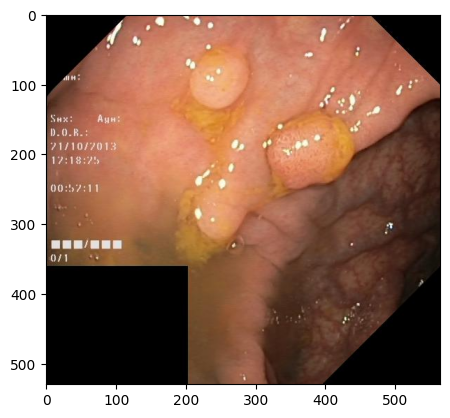

In [45]:
plt.imshow(image)
show_mask(masks)
show_box(input_bbox)

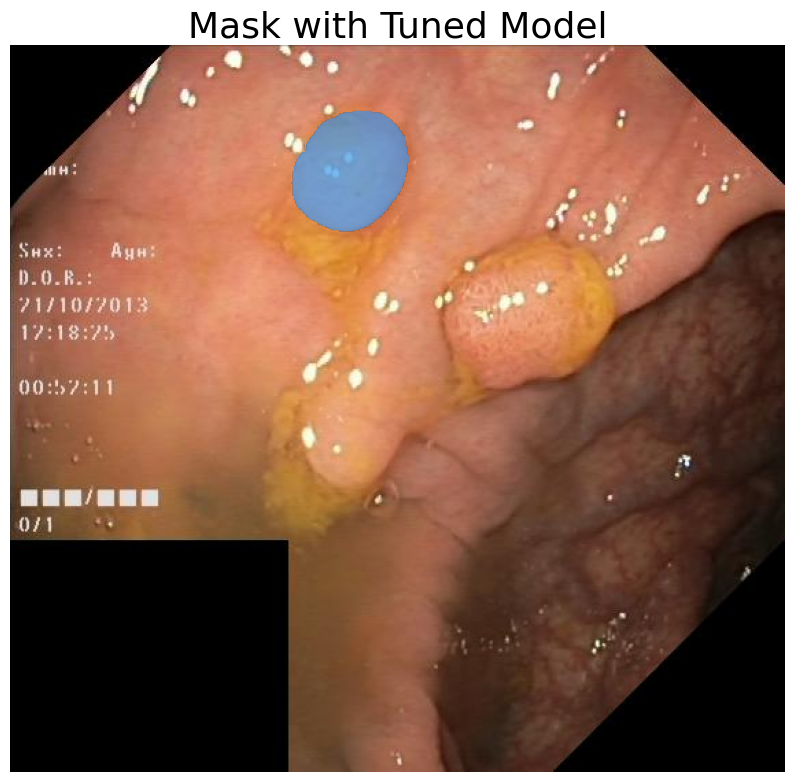

In [51]:
%matplotlib inline
import matplotlib.pyplot as plt

# Assuming 'image' is the original image you want to display
# and you have 'masks' and 'input_bbox' ready for visualization

fig, ax = plt.subplots(1, 1, figsize=(10, 10))  # Create a figure and a single subplot

ax.imshow(image)  # Display the image

# Assuming these functions can take 'ax' as an argument to overlay directly on the subplot
# If not, you will need to adjust their implementations accordingly
show_mask(masks, ax)  # Overlay mask on the image
#show_box(input_bbox, ax)  # Overlay bounding boxes on the image

ax.set_title('Mask with Tuned Model', fontsize=26)
ax.axis('off')  # Hide axes

plt.show()  # Display the plot


In [61]:
a

array([[200,  39, 296, 141],
       [310, 134, 444, 254]])

In [126]:
np_array

[array([     27.477,      6.3026,      560.04,      527.42], dtype=float32)]

In [127]:
results = []
for bbox in np_array:  # Assuming 'a' is your array of bounding boxes
    masks, k, d = predictor.predict(
        point_coords=None,
        box=bbox,
        multimask_output=False,
    )
    results.append(masks)

In [128]:
results

[array([[[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]])]

In [129]:
masks

array([[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]])

In [130]:
combined_mask = np.zeros_like(results[0], dtype=bool)

In [131]:
combined_mask

array([[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]])

In [132]:
for mask in results:
    combined_mask = np.logical_or(combined_mask, mask)

In [133]:
combined_mask.shape

(1, 530, 565)

In [134]:
if combined_mask.ndim == 3:
    combined_mask = combined_mask.squeeze(0)

In [135]:
combined_mask.shape

(530, 565)

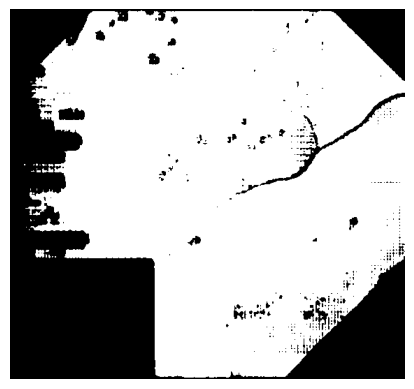

In [136]:
plt.imshow(combined_mask, cmap='gray')  # Use a grayscale colormap for binary data
plt.axis('off')  # Optionally, turn off the axis
plt.show()

In [71]:
image.shape

(530, 565, 3)

In [72]:
mask_rgb = np.zeros_like(image)
mask_rgb[combined_mask, :] = [255, 0, 0] 

In [73]:
mask_rgb.shape

(530, 565, 3)

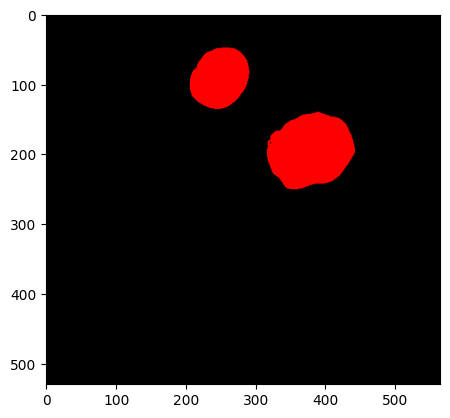

In [75]:
plt.imshow(mask_rgb)

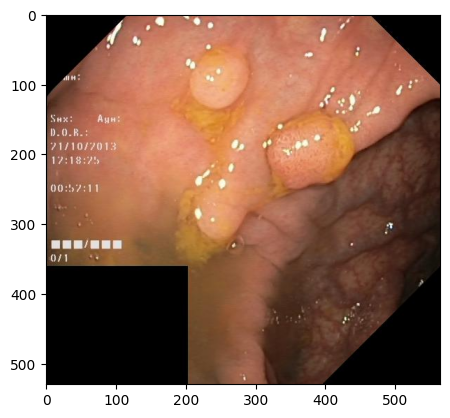

In [77]:
plt.imshow(image)

In [78]:
def overlay_colored_mask_on_image(image, colored_mask, alpha=0.3):

    # Ensure the mask is an integer format
    colored_mask = colored_mask.astype(np.uint8)

    # Determine where the mask is not just black (background)
    mask_presence = np.any(colored_mask > 0, axis=-1)

    # Convert image for overlay computation
    image_f = image.astype(np.float32)
    mask_f = colored_mask.astype(np.float32)

    # Compute the overlay only on mask presence
    overlay = np.where(mask_presence[..., None], 
                       (1-alpha) * image_f + alpha * mask_f, 
                       image_f)

    # Clip and convert back to original image format
    overlay = np.clip(overlay, 0, 255).astype(np.uint8)

    return overlay

In [81]:
colored_mask = np.zeros_like(image)

# Set the mask area to red [255, 0, 0]
colored_mask[combined_mask] = [0, 255, 0] 

In [104]:
colored_mask = np.zeros_like(image)

# Set the mask area to red [255, 0, 0]
colored_mask[combined_mask] = [0, 255, 0] 

overlayed_image = overlay_colored_mask_on_image(image, colored_mask, alpha=0.3)

# Display the result
plt.imshow(overlayed_image)
plt.axis('off')
plt.show()

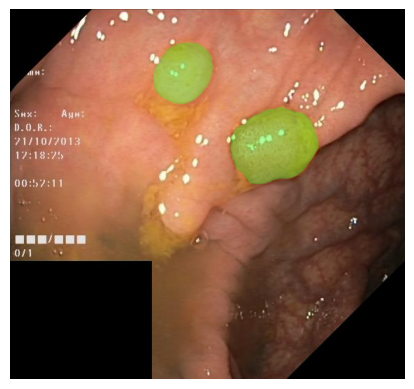

In [105]:
overlayed_image = overlay_colored_mask_on_image(image, colored_mask, alpha=0.3)

# Display the result
plt.imshow(overlayed_image)
plt.axis('off')
plt.show()

In [84]:
bbox_coords_val_1

{'2e86a9ba-6d50-4748-8a2b-8dd2c872220b.jpg': array([200,  39, 296, 141])}

# Complete Pipeline

In [137]:
image_folder_sorted[0]

'/media/rohit/mirlproject2/fetal head circumference/1segmented-images/image-segmentation-yolov8-main/data/images/val/0dad158b-043d-427d-a656-b1034b9a6a0d.jpg'

In [138]:
image_folder_sorted[0].replace('images','masks')

'/media/rohit/mirlproject2/fetal head circumference/1segmented-masks/image-segmentation-yolov8-main/data/masks/val/0dad158b-043d-427d-a656-b1034b9a6a0d.jpg'

In [156]:
len(result.boxes.data)==0

True

In [152]:
result==None

False

In [1]:
from ultralytics import YOLO

import cv2
import matplotlib.pyplot as plt
import os
import numpy as np
import sys
import glob
from tqdm.notebook import tqdm

In [2]:
yolo_model_path = '/media/rohit/mirlproject2/fetal head circumference/1segmented-images/image-segmentation-yolov8-main/runs/detect/train/weights/best.pt'
yolo_model = YOLO(yolo_model_path)

In [ ]:
img = cv2.imread(image_path)
results = yolo_model(img)

ori_mask=cv2.imread(image_path.replace('imgs','masks'))

In [ ]:
for result in results:
    if len(result.boxes.data)!=0:
        #print(result.boxes.data)
        #coordinates = filter_boxes(result.boxes.data)
        #bbox_coords_val_1[os.path.basename(image_path)] = coordinates
        np_array = result.boxes.data.cpu().numpy()[:, :4]

  0%|          | 0/950 [00:00<?, ?it/s]

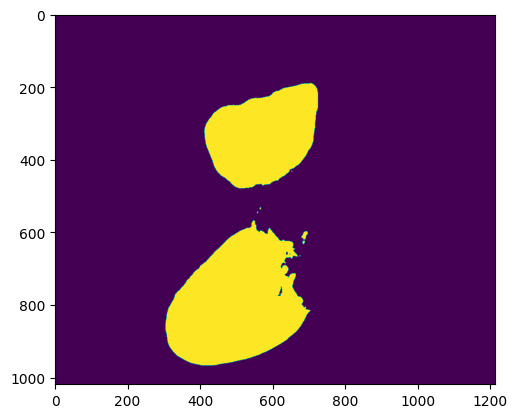

In [7]:
from ultralytics import YOLO

import cv2
import matplotlib.pyplot as plt
import os
import numpy as np
import sys
import glob
from tqdm.notebook import tqdm

import logging
logging.getLogger('ultralytics').setLevel(logging.ERROR) 


def is_inside(inner, outer):
    return all([
        inner[0] >= outer[0],  # Inner box's left edge is right of the outer box's left edge
        inner[1] >= outer[1],  # Inner box's top edge is below the outer box's top edge
        inner[2] <= outer[2],  # Inner box's right edge is left of the outer box's right edge
        inner[3] <= outer[3],  # Inner box's bottom edge is above the outer box's bottom edge
    ])

def filter_boxes(boxes):

    filtered_boxes = []

    for i, box in enumerate(boxes):
        # Check if this box is inside any other box
        if not any(is_inside(box, boxes[j]) for j in range(len(boxes)) if i != j):
            filtered_boxes.append(box)

    return filtered_boxes


def overlay_colored_mask_on_image(image, colored_mask, alpha=0.3):

    # Ensure the mask is an integer format
    colored_mask = colored_mask.astype(np.uint8)

    # Determine where the mask is not just black (background)
    mask_presence = np.any(colored_mask > 0, axis=-1)

    # Convert image for overlay computation
    image_f = image.astype(np.float32)
    mask_f = colored_mask.astype(np.float32)

    # Compute the overlay only on mask presence
    overlay = np.where(mask_presence[..., None], 
                       (1-alpha) * image_f + alpha * mask_f, 
                       image_f)

    # Clip and convert back to original image format
    overlay = np.clip(overlay, 0, 255).astype(np.uint8)

    return overlay


#Yolo_v8

yolo_model_path = '/media/rohit/mirlproject2/fetal head circumference/1segmented-images/image-segmentation-yolov8-main/runs/detect/train/weights/best.pt'
yolo_model = YOLO(yolo_model_path)

# SAM
model_type = 'vit_h'
checkpoint = './sam_vit_h_4b8939.pth'
device = 'cuda'

from segment_anything import SamPredictor, sam_model_registry
sam_model = sam_model_registry[model_type](checkpoint=checkpoint)
sam_model.to(device)
predictor = SamPredictor(sam_model)


image_paths = glob.glob('/media/rohit/mirlproject2/fetal head circumference/1segmented-images/train/imgs/*')
image_folder_sorted=sorted(image_paths)


for image_path in tqdm(image_folder_sorted):

    if os.path.basename(image_path)!= '3bd30288-3126-4091-8f5b-b459cde5e48a.jpg':
        continue

    img = cv2.imread(image_path)
    results = yolo_model(img)

    ori_mask=cv2.imread(image_path.replace('imgs','masks'))

    for result in results:
        if len(result.boxes.data)!=0:
            #print(result.boxes.data)
            #coordinates = filter_boxes(result.boxes.data)
            #bbox_coords_val_1[os.path.basename(image_path)] = coordinates
            np_array = result.boxes.data.cpu().numpy()[:, :4]
            filtered_array = filter_boxes(np_array)

        else:
            print("No detections for this image, skipping to the next one.")
            continue
          
    
    predictor.set_image(img)
    results = []
    for bbox in filtered_array: 
        masks, _, _ = predictor.predict(
            point_coords=None,
            box=bbox,
            multimask_output=False,
        )
        results.append(masks)
        bbox_int = tuple(map(int, bbox))
        cv2.rectangle(img, (bbox_int[0], bbox_int[1]), (bbox_int[2], bbox_int[3]), (0, 255, 0), 2)

    combined_mask = np.zeros_like(results[0], dtype=bool)

    for mask in results:
        combined_mask = np.logical_or(combined_mask, mask)

    if combined_mask.ndim == 3:
        combined_mask = combined_mask.squeeze(0)

    colored_mask = np.zeros_like(img)

    colored_mask[combined_mask] = [255, 0, 0]


    overlayed_image = overlay_colored_mask_on_image(img, colored_mask, alpha=0.3)


    plt.imshow(combined_mask)
    '''
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(cv2.cvtColor(overlayed_image,cv2.COLOR_BGR2RGB))
    axs[0].set_title(os.path.basename(image_path))
    axs[1].imshow(ori_mask, cmap='gray')
    axs[1].set_title('ori_mask')

    for ax in axs:
        ax.axis('off')
    '''
    plt.show()

(-0.5, 1213.5, 1018.5, -0.5)

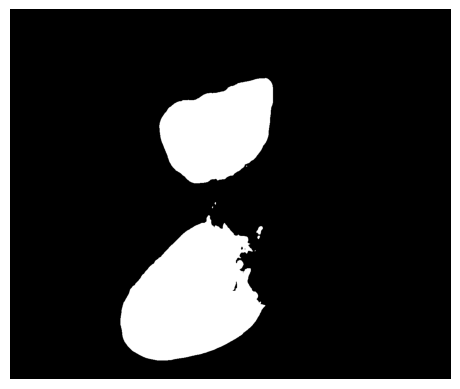

: 

In [9]:
plt.imshow(combined_mask,cmap='gray')
plt.axis('off')

In [36]:
filtered_array

[array([     294.07,       575.1,      695.45,      972.58], dtype=float32),
 array([      397.9,      187.66,      737.27,      490.58], dtype=float32)]

In [38]:
bbox

array([      397.9,      187.66,      737.27,      490.58], dtype=float32)

In [39]:
bbox[0]

397.90356

In [35]:
np_array

array([[     294.07,       575.1,      695.45,      972.58],
       [      397.9,      187.66,      737.27,      490.58]], dtype=float32)

In [41]:
bbox_int = tuple(map(int, bbox))
bbox_int

(397, 187, 737, 490)

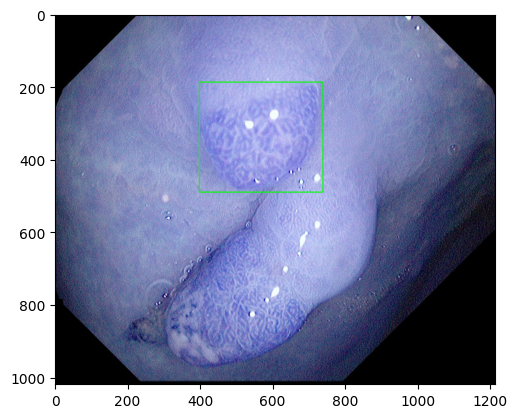

In [43]:
bbox_int = tuple(map(int, bbox))
cv2.rectangle(img, (bbox_int[0], bbox_int[1]), (bbox_int[2], bbox_int[3]), (0, 255, 0), 2)
plt.imshow(img)

In [13]:
masks

array([[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]])

In [14]:
results

[array([[[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]]),
 array([[[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]])]

In [12]:
import numpy as np

def dice_score(true_mask, pred_mask):
    # Ensuring the masks are 2D
    if true_mask.ndim > 2:
        true_mask = true_mask.squeeze()
    if pred_mask.ndim > 2:
        pred_mask = pred_mask.squeeze()

    intersection = np.sum(pred_mask[true_mask == True])
    true_sum = np.sum(true_mask)
    pred_sum = np.sum(pred_mask)
    
    if (true_sum + pred_sum) == 0:
        return 1
    return 2. * intersection / (true_sum + pred_sum)

In [21]:
import numpy as np

# Simulate pred and true_mask based on your structure
pred = results  # Example prediction list
true_mask = ori_mask

# Convert the list of predicted masks to a single mask (logical OR for aggregation)
pred_aggregated = np.logical_or.reduce([p for p in pred])  # Updated for multiple masks

# Ensure the true mask is boolean
true_mask_boolean = true_mask > 0

true_mask_binary = np.any(true_mask_boolean, axis=-1)

# Remove the singleton dimension from pred_aggregated
pred_aggregated_squeezed = pred_aggregated.squeeze(0)

print(true_mask_binary.shape)  # Should be (1019, 1214)
print(pred_aggregated_squeezed.shape)  # Should also be (1019, 1214)

# Calculate the Dice score using the adjusted masks
dice_score_value = dice_score(true_mask_binary, pred_aggregated_squeezed)
print(f"Dice Score: {dice_score_value}")


(1019, 1214)
(1019, 1214)
Dice Score: 0.9296303123643478


  0%|          | 0/50 [00:00<?, ?it/s]

Dice Score: 0.8472751650265951


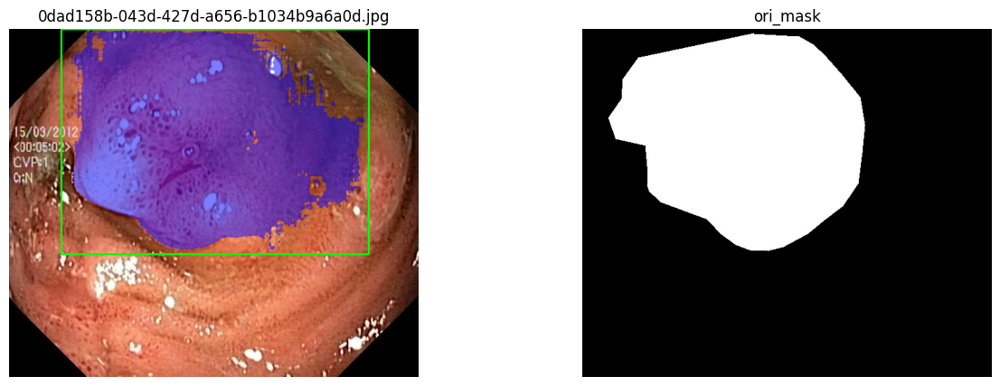

Dice Score: 0.9306032783191573


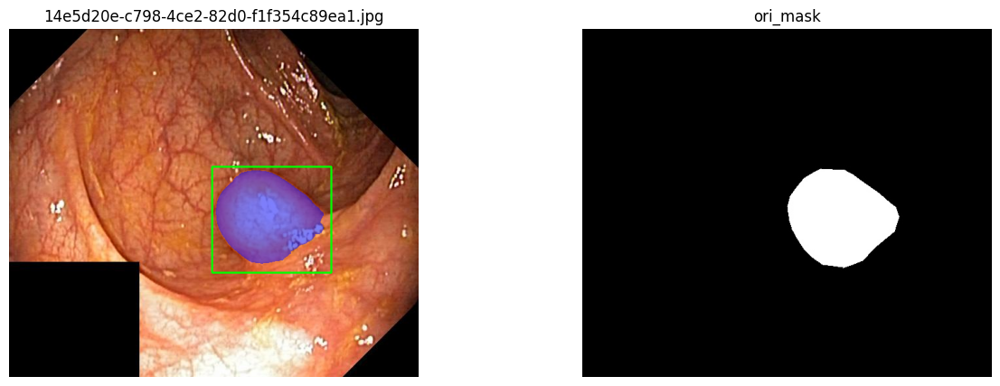

Dice Score: 0.9593903425336325


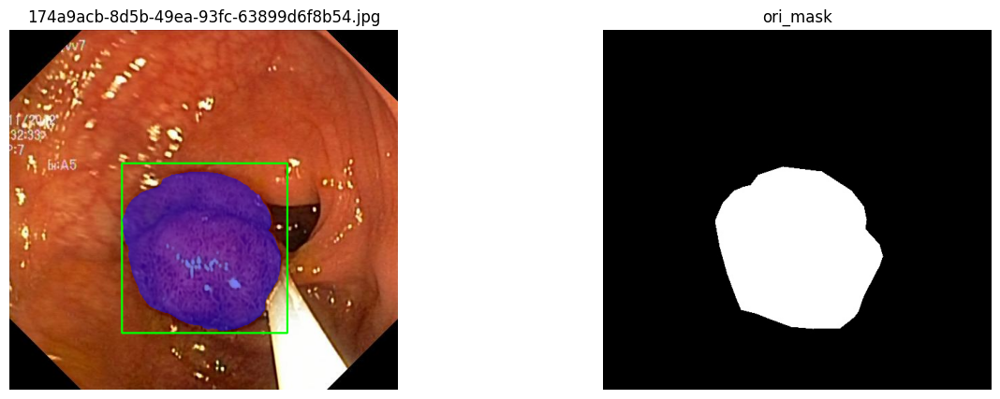

Dice Score: 0.9402334792578695


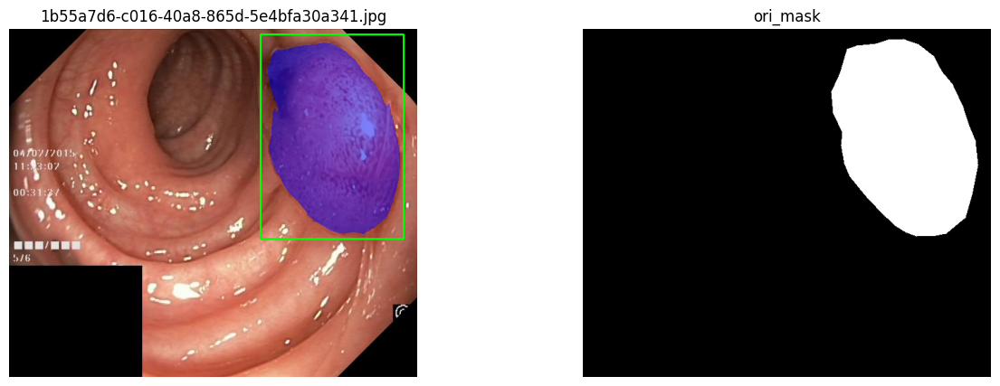

Dice Score: 0.9666315846286702


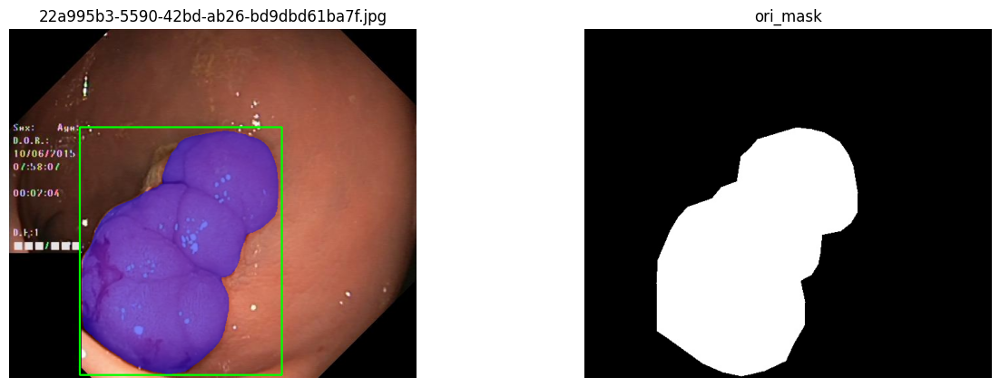

Dice Score: 0.8727763493153076


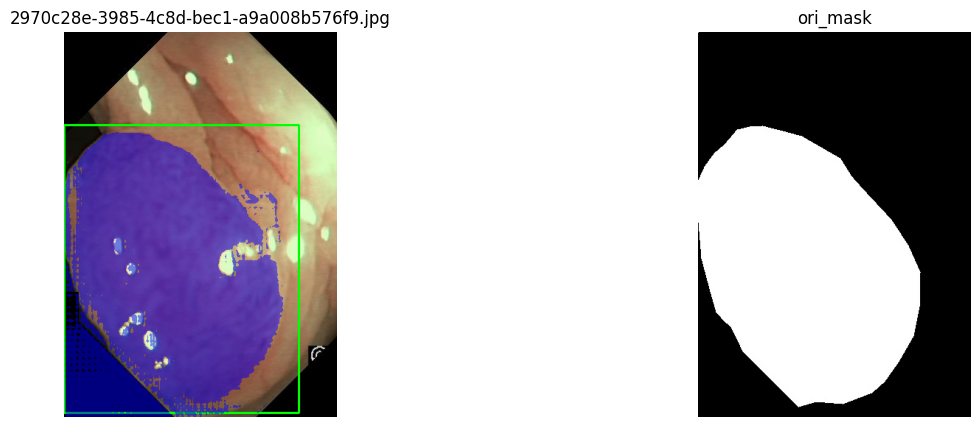

Dice Score: 0.8159296830318172


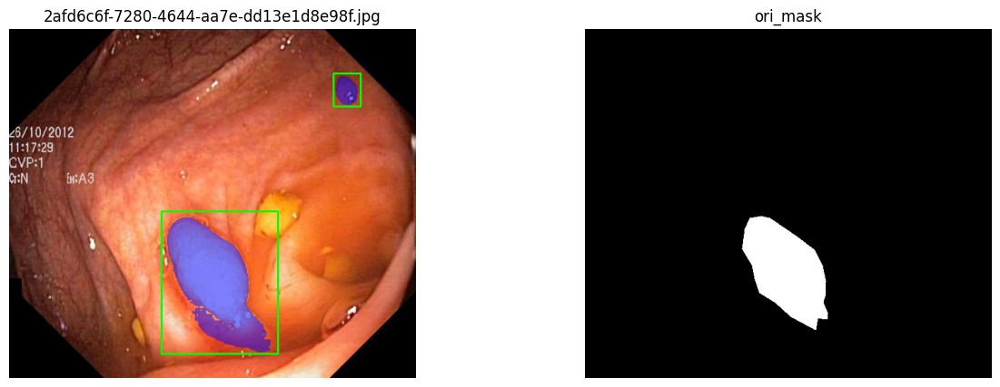

Dice Score: 0.9562411156786661


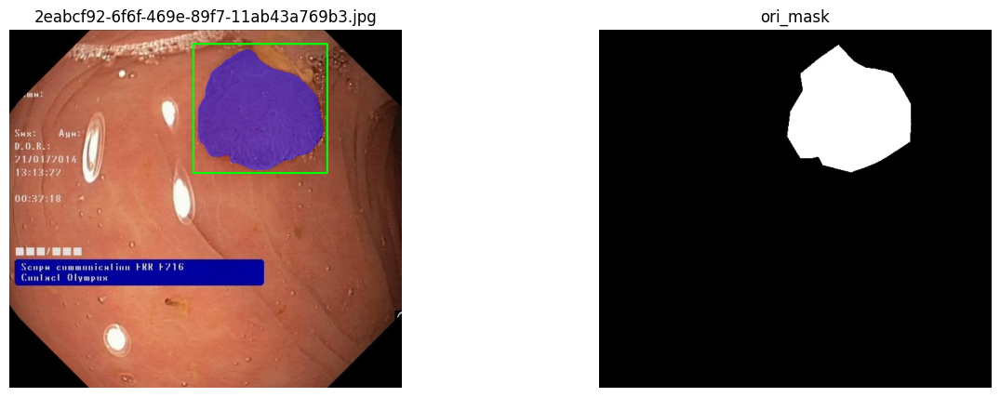

Dice Score: 0.9165236998186364


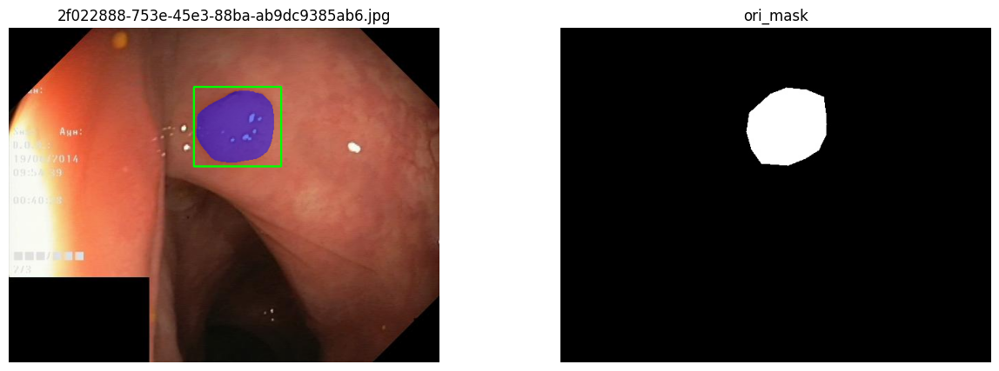

Dice Score: 0.9428010310543758


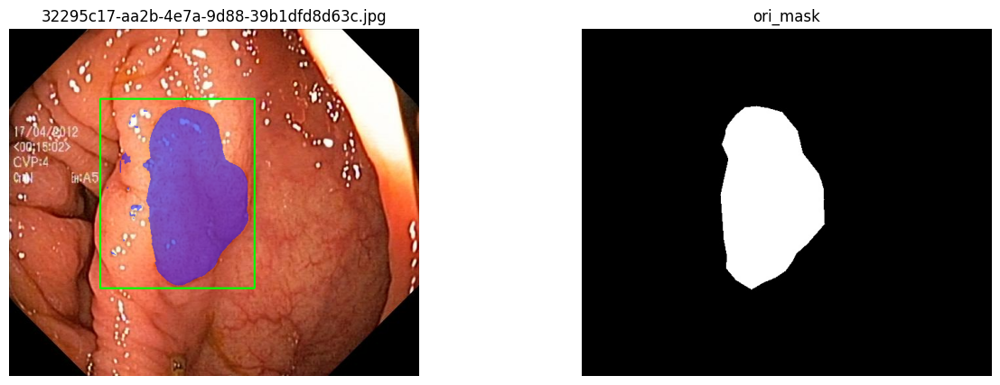

Dice Score: 0.8704297022238975


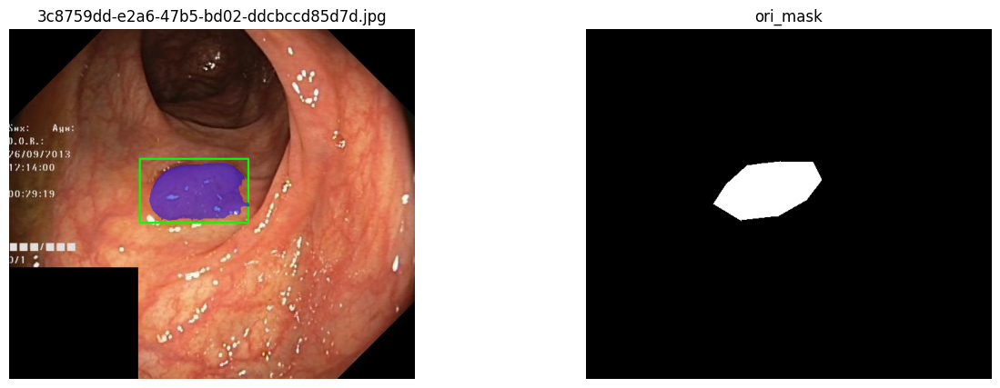

Dice Score: 0.36285842007791047


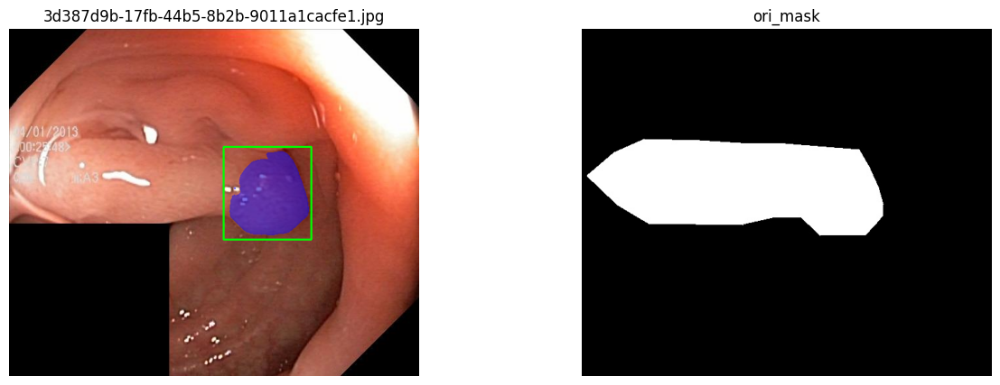

Dice Score: 0.9640412400899872


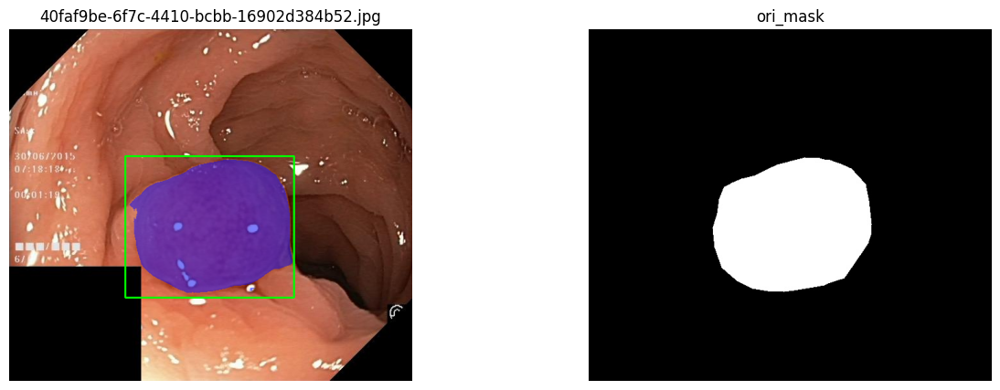

Dice Score: 0.5423797282409107


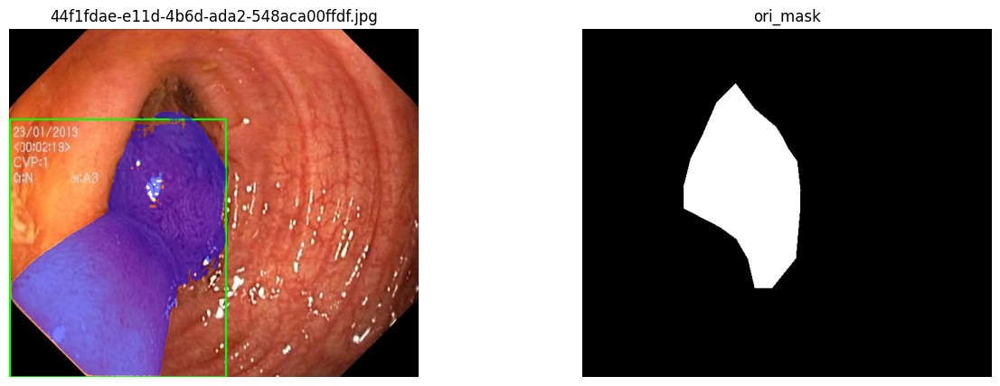

Dice Score: 0.9512760125091695


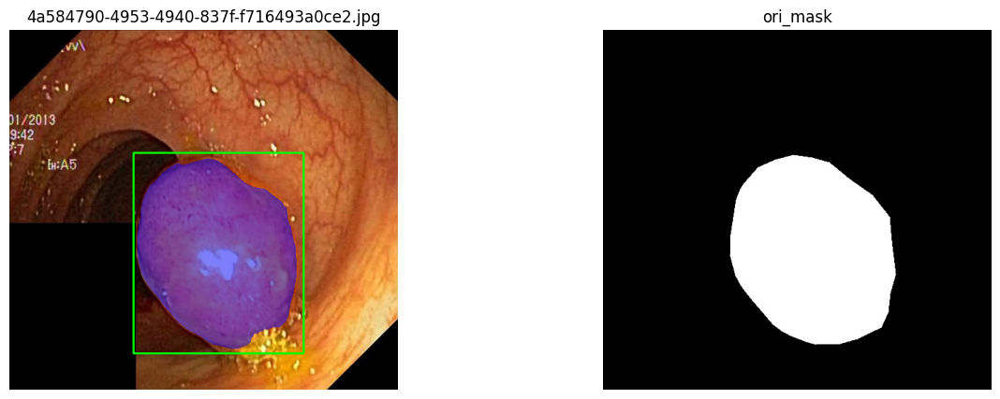

Dice Score: 0.9425623271811704


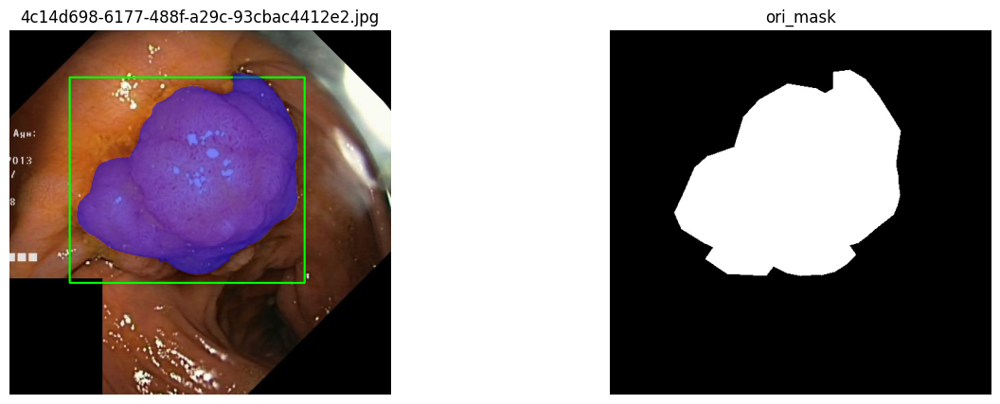

Dice Score: 0.9023796471751132


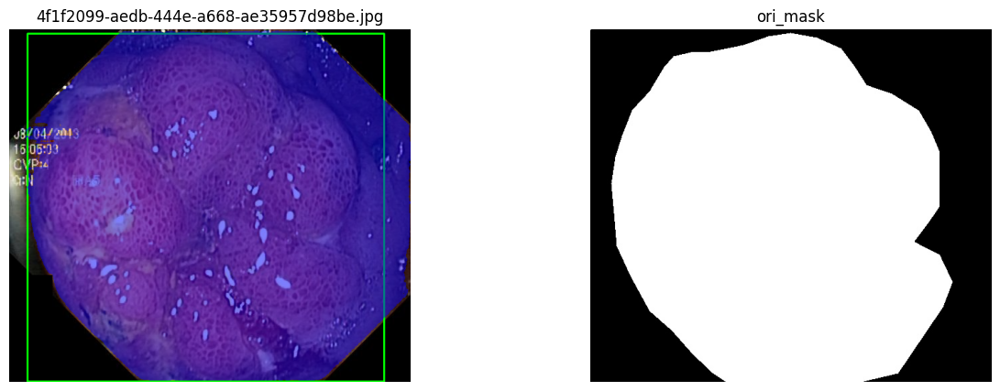

Dice Score: 0.981651551677955


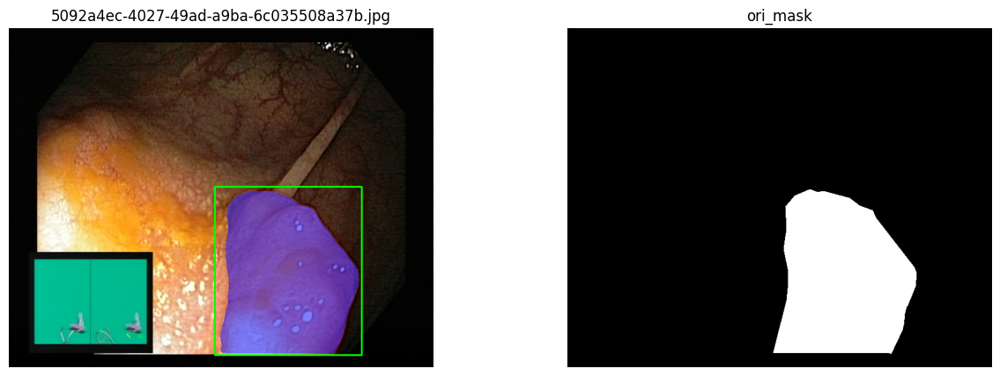

Dice Score: 0.9226122509116358


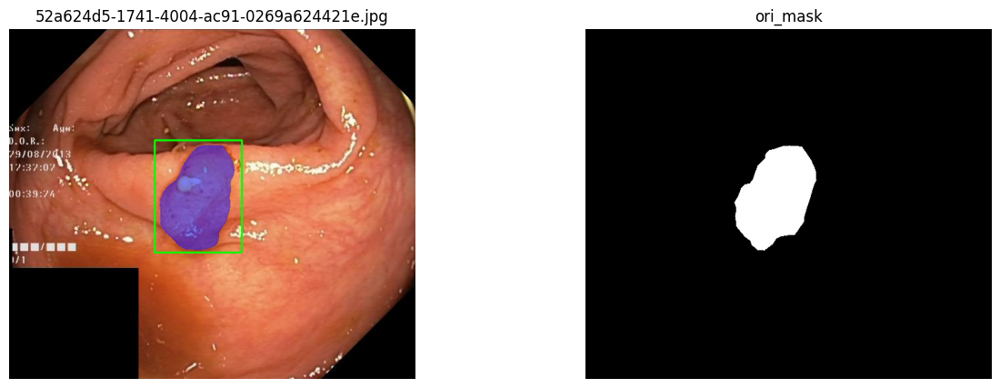

Dice Score: 0.9333952392621158


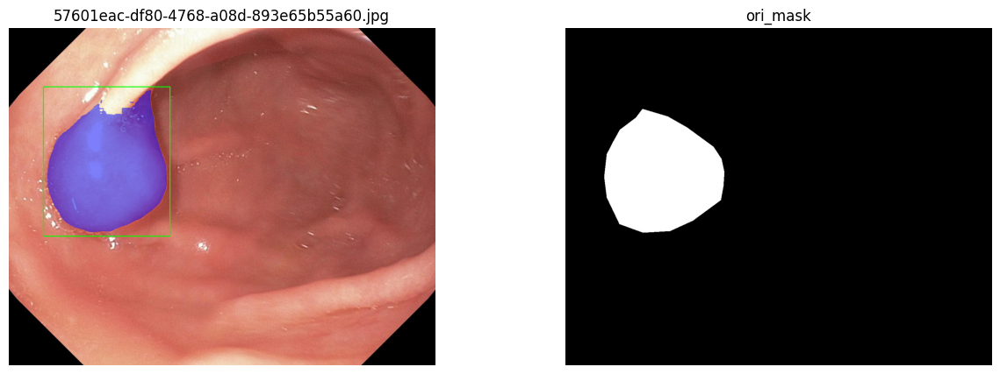

Dice Score: 0.9337006016434818


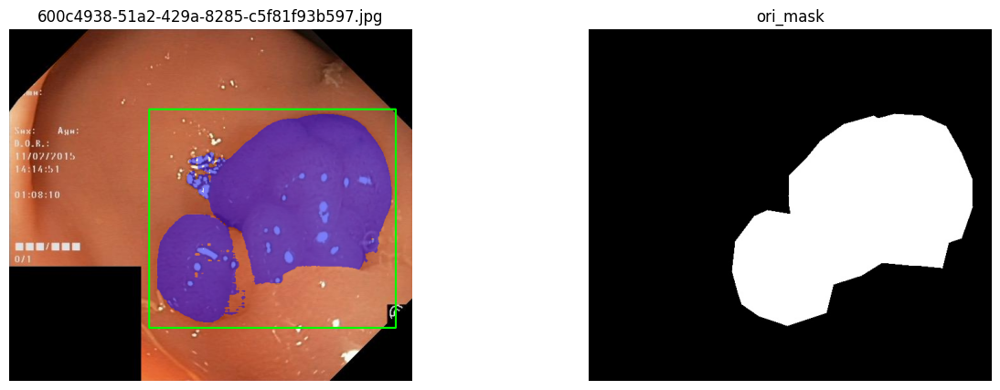

Dice Score: 0.9781584082672596


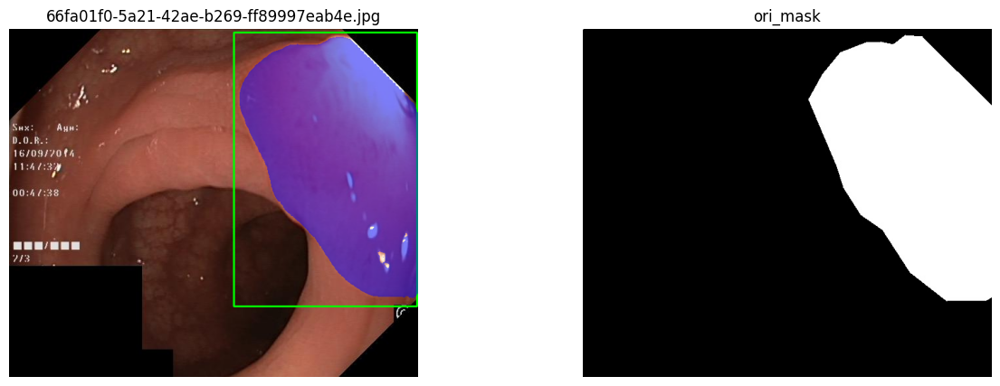

Dice Score: 0.9687386404943656


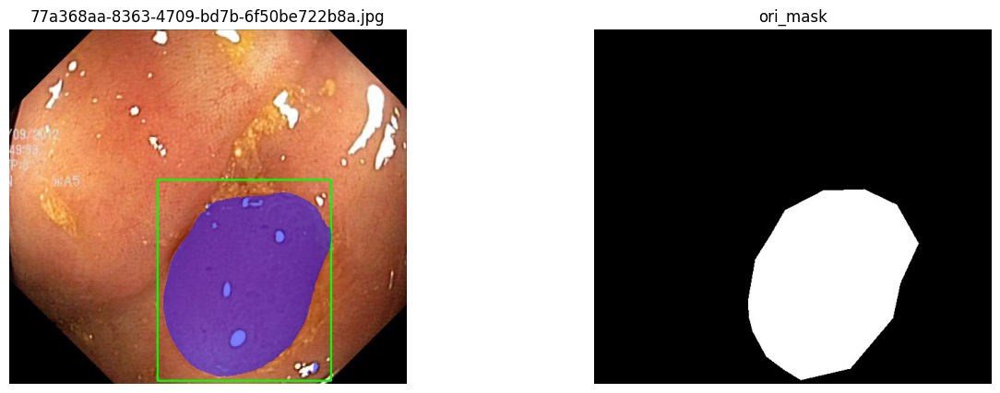

Dice Score: 0.9740111544436756


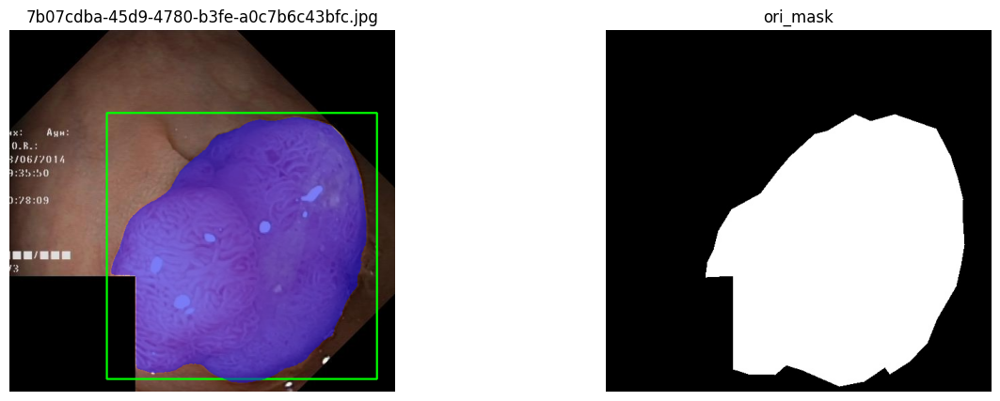

Dice Score: 0.9127290260366442


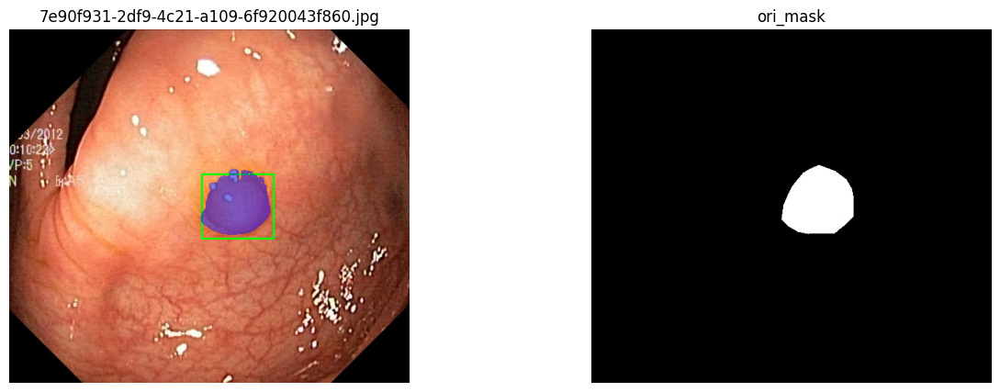

Dice Score: 0.9399464619425224


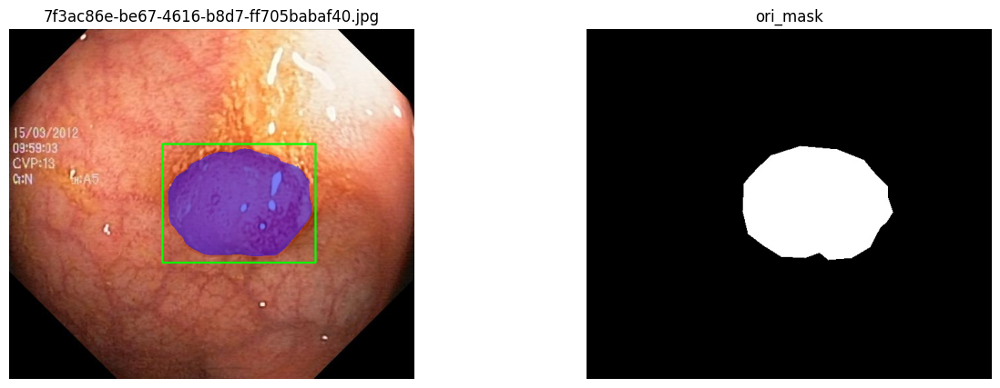

Dice Score: 0.9493858456715285


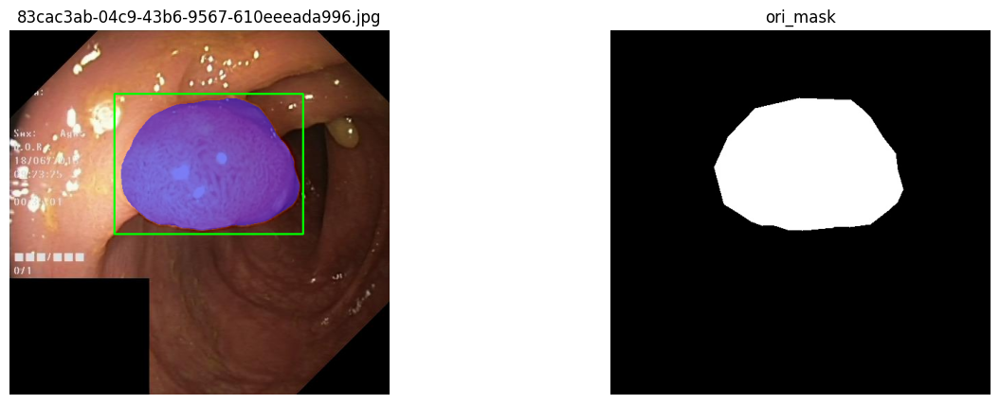

Dice Score: 0.9350217666359288


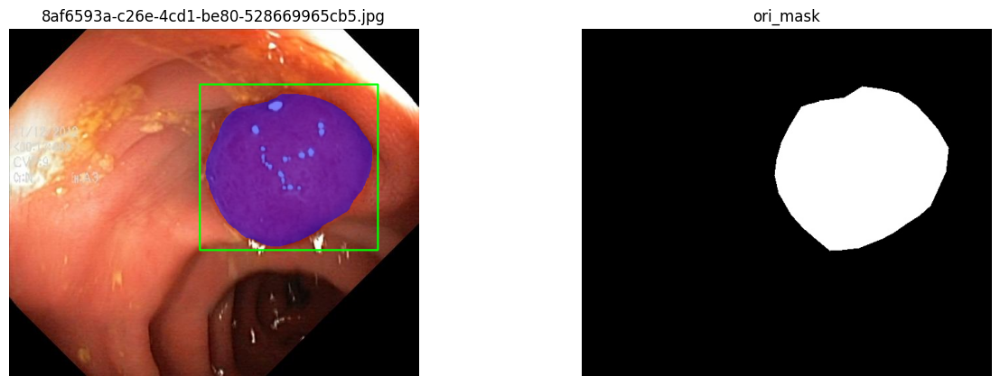

Dice Score: 0.8121928755397945


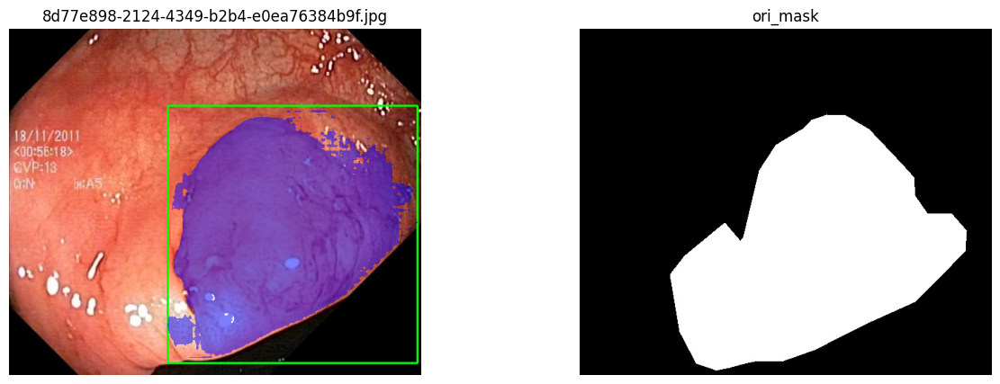

Dice Score: 0.9444115018010284


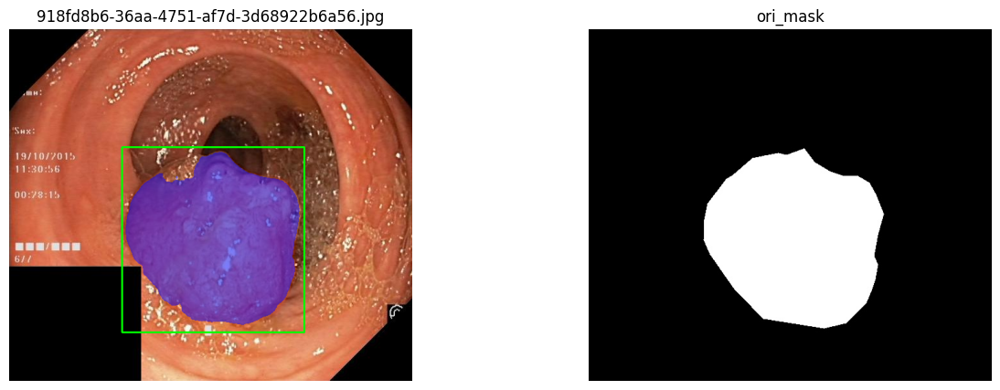

Dice Score: 0.9025924993707526


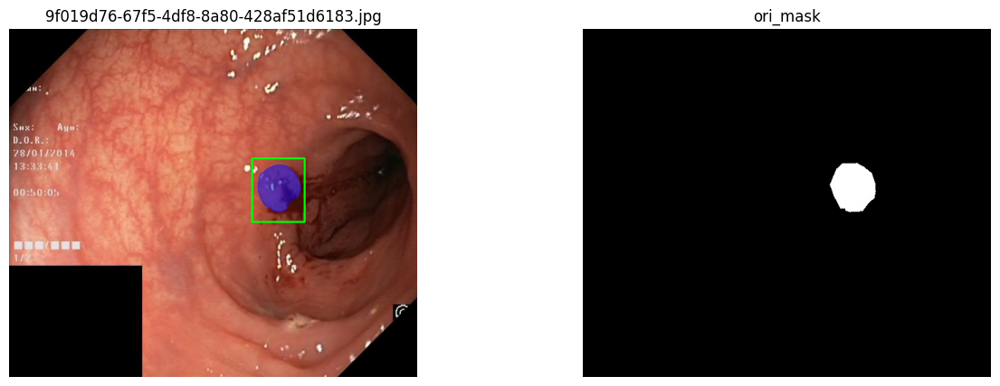

Dice Score: 0.9304268880160083


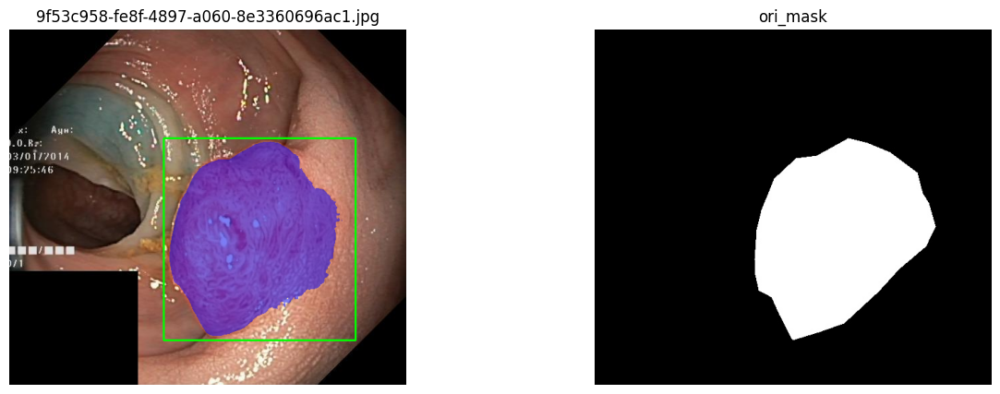

Dice Score: 0.8381989433113483


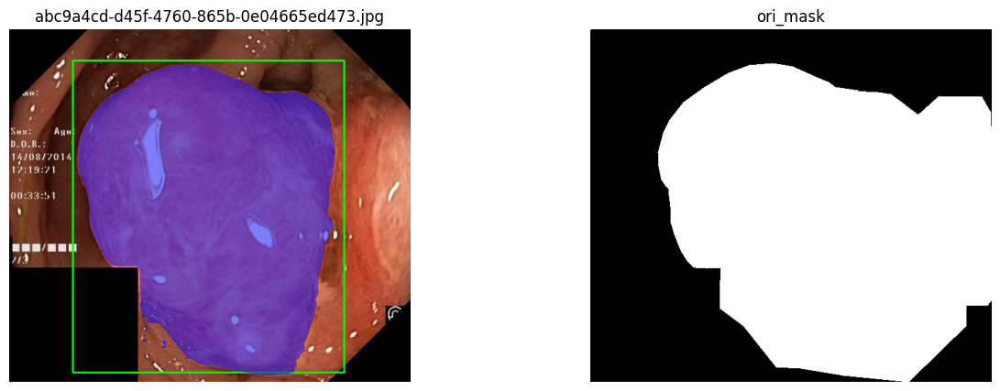

Dice Score: 0.9111319457466092


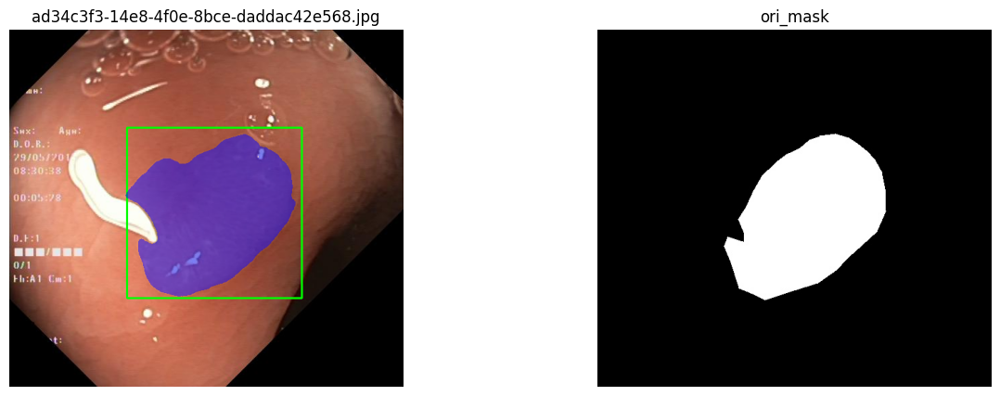

Dice Score: 0.9414872364039956


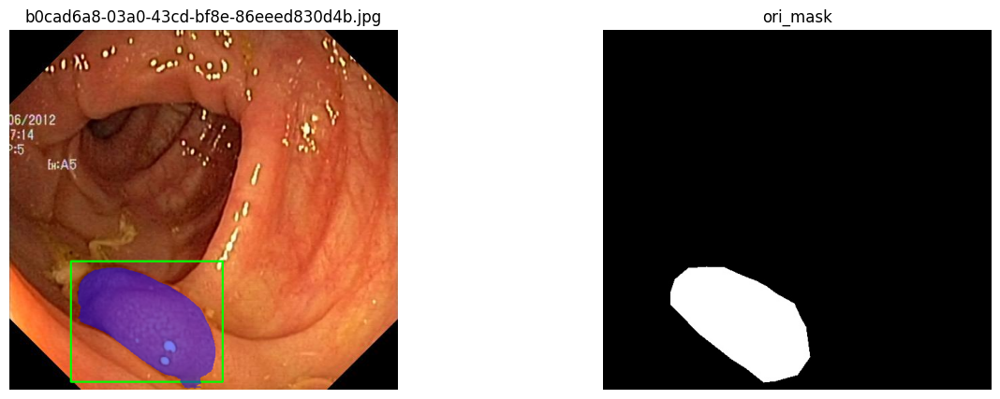

Dice Score: 0.9002277540256522


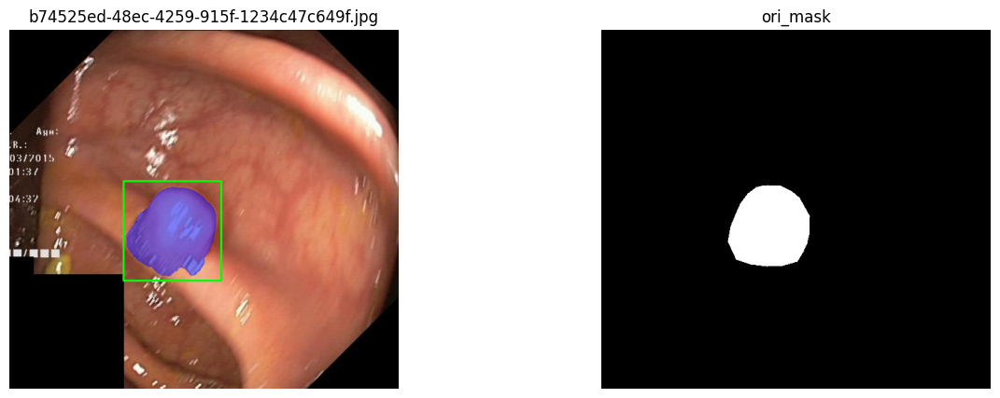

Dice Score: 0.4624294375914698


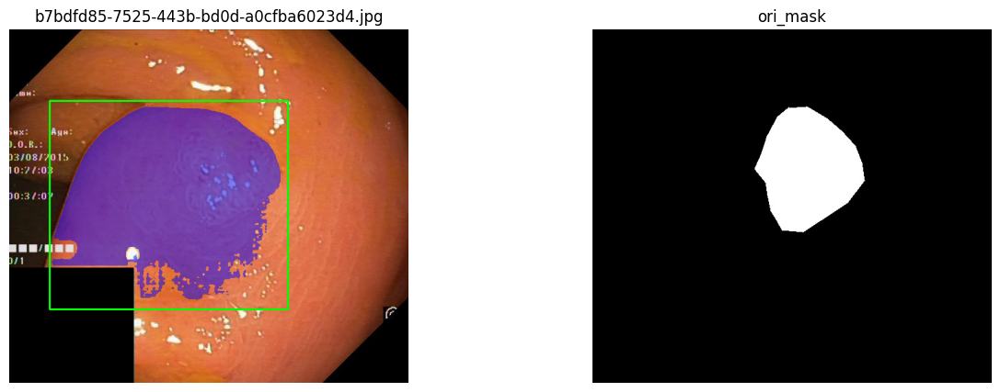

Dice Score: 0.9083820662768031


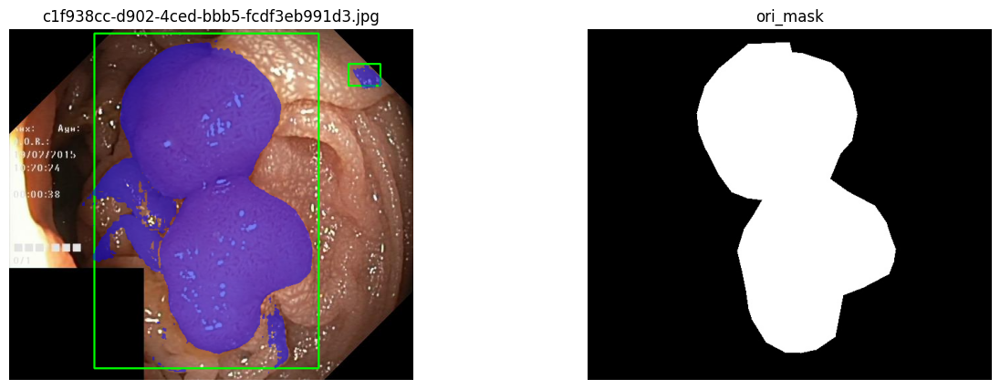

Dice Score: 0.9109871377653804


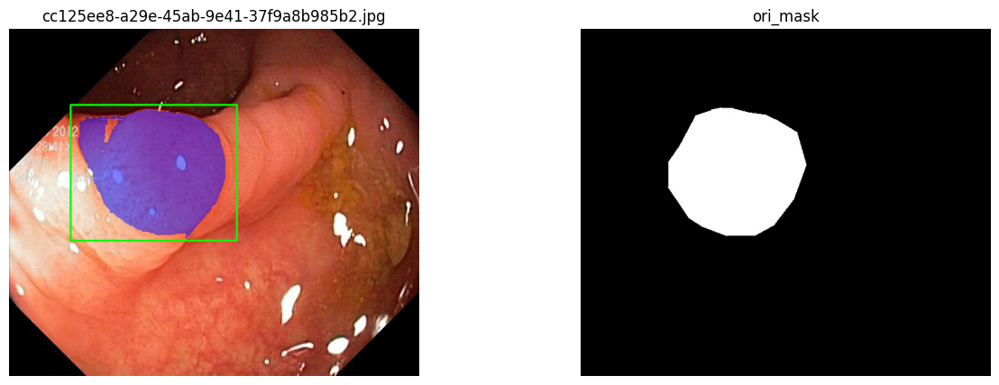

Dice Score: 0.897884548002803


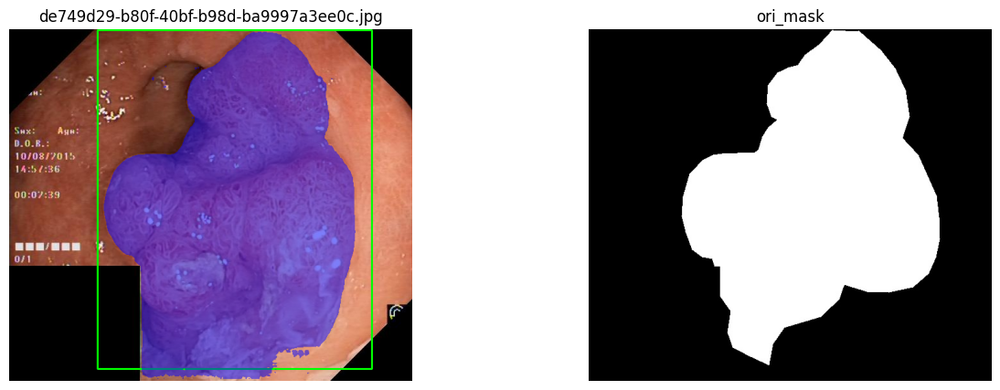

Dice Score: 0.950165634451966


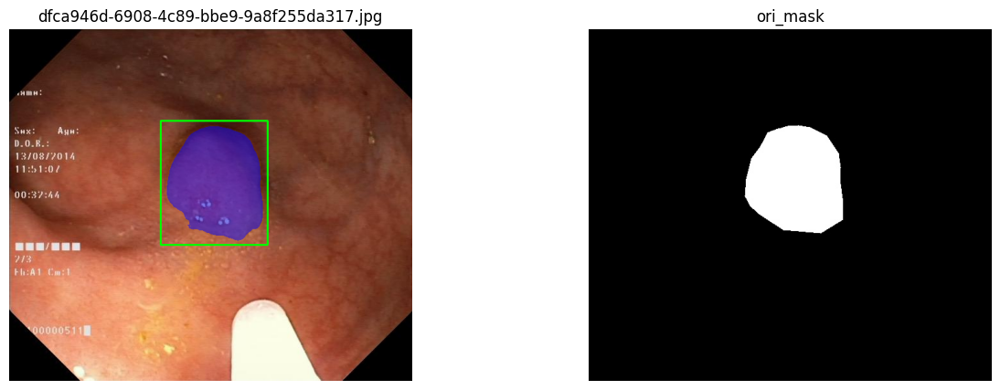

Dice Score: 0.9674428355655932


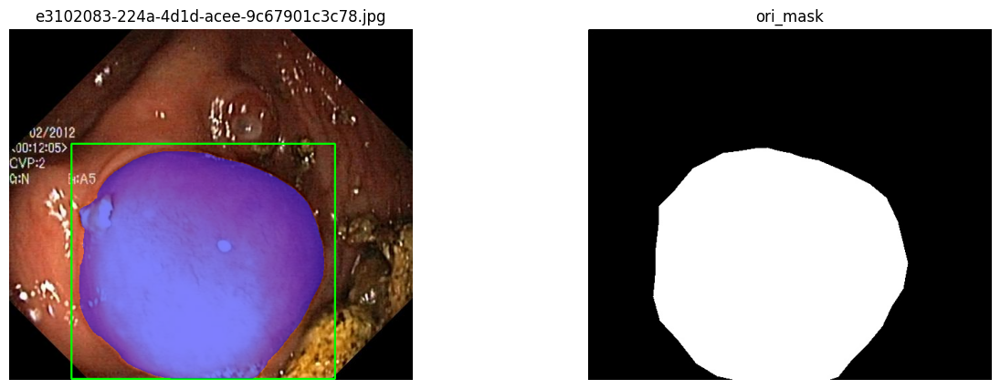

Dice Score: 0.3614789034324481


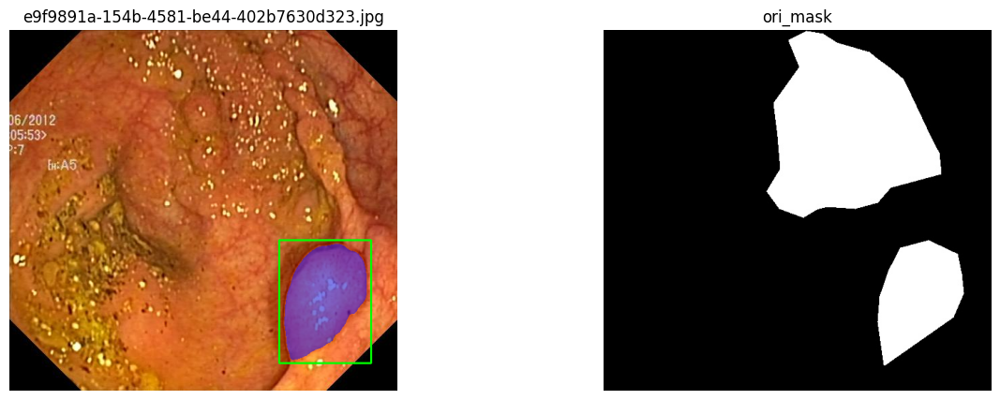

Dice Score: 0.9675595074830068


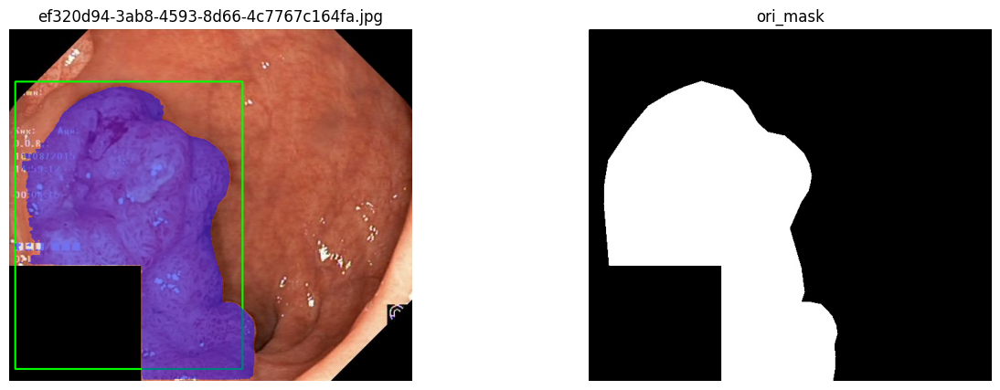

Dice Score: 0.9255477203383075


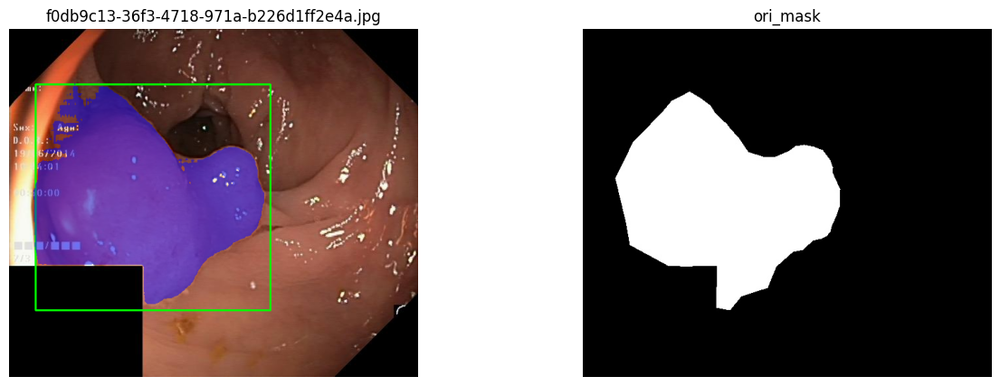

Dice Score: 0.9629629629629629


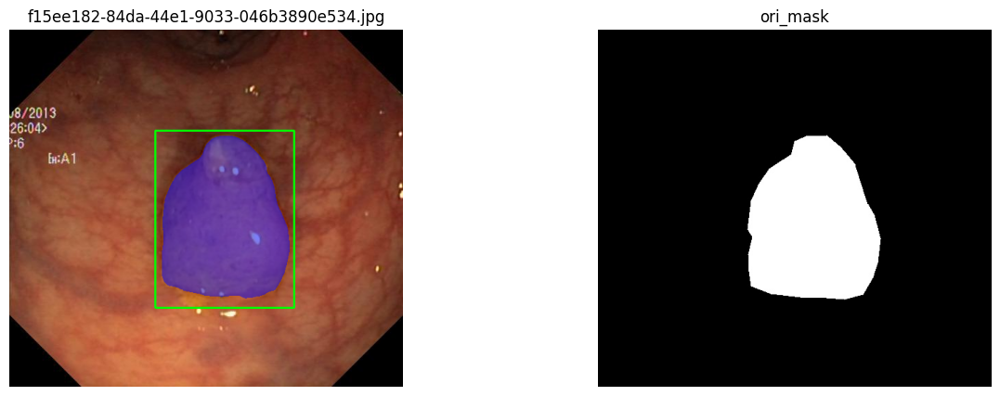

Dice Score: 0.6577329339429292


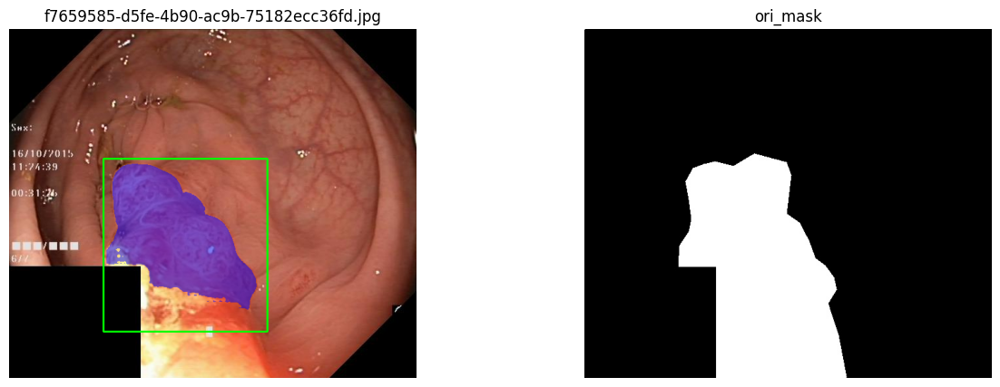

Dice Score: 0.9587210600759324


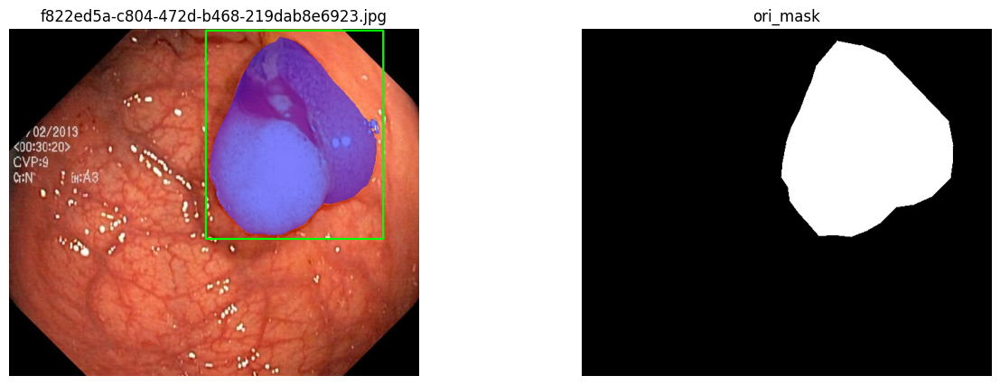

Dice Score: 0.9319301125703565


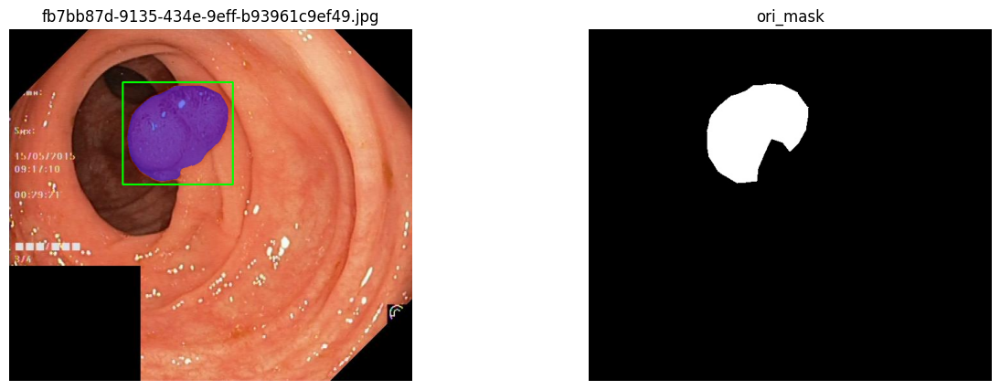

No detections for this image, skipping to the next one.
Dice Score: 0.0


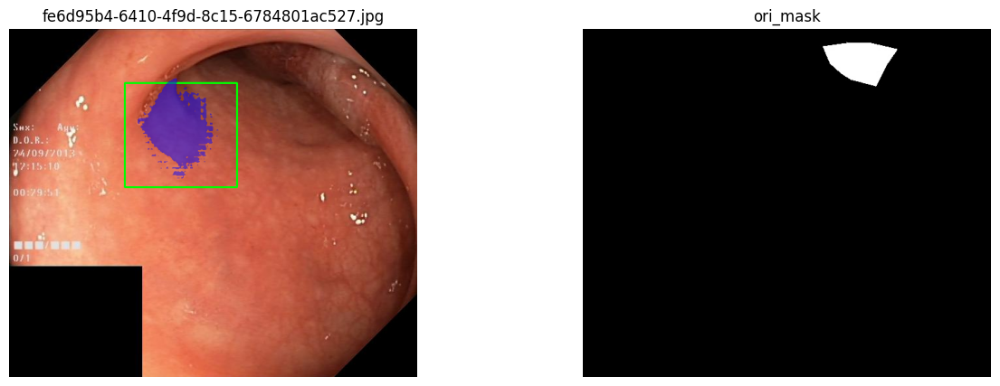

avg_dice_score: 0.8631515651565028


In [46]:
from ultralytics import YOLO

import cv2
import matplotlib.pyplot as plt
import os
import numpy as np
import sys
import glob
from tqdm.notebook import tqdm

import logging
logging.getLogger('ultralytics').setLevel(logging.ERROR) 


def is_inside(inner, outer):
    return all([
        inner[0] >= outer[0],  # Inner box's left edge is right of the outer box's left edge
        inner[1] >= outer[1],  # Inner box's top edge is below the outer box's top edge
        inner[2] <= outer[2],  # Inner box's right edge is left of the outer box's right edge
        inner[3] <= outer[3],  # Inner box's bottom edge is above the outer box's bottom edge
    ])

def filter_boxes(boxes):

    filtered_boxes = []

    for i, box in enumerate(boxes):
        # Check if this box is inside any other box
        if not any(is_inside(box, boxes[j]) for j in range(len(boxes)) if i != j):
            filtered_boxes.append(box)

    return filtered_boxes

# def draw_box(img, boxes):
#     boxes = filter_boxes(boxes)  # Filter boxes to remove inner boxes
#     for box in boxes:
#         x1, y1, x2, y2 = map(int, box[:4])
#         coordinates=np.array([x1,y1,x2,y2])
#         cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
#     return img,coordinates


def overlay_colored_mask_on_image(image, colored_mask, alpha=0.5):

    # Ensure the mask is an integer format
    colored_mask = colored_mask.astype(np.uint8)

    # Determine where the mask is not just black (background)
    mask_presence = np.any(colored_mask > 0, axis=-1)

    # Convert image for overlay computation
    image_f = image.astype(np.float32)
    mask_f = colored_mask.astype(np.float32)

    # Compute the overlay only on mask presence
    overlay = np.where(mask_presence[..., None], 
                       (1-alpha) * image_f + alpha * mask_f, 
                       image_f)

    # Clip and convert back to original image format
    overlay = np.clip(overlay, 0, 255).astype(np.uint8)

    return overlay


def dice_score(true_mask, pred_mask):
    # Ensuring the masks are 2D
    if true_mask.ndim > 2:
        true_mask = true_mask.squeeze()
    if pred_mask.ndim > 2:
        pred_mask = pred_mask.squeeze()

    intersection = np.sum(pred_mask[true_mask == True])
    true_sum = np.sum(true_mask)
    pred_sum = np.sum(pred_mask)
    
    if (true_sum + pred_sum) == 0:
        return 1
    return 2. * intersection / (true_sum + pred_sum)


#Yolo_v8

yolo_model_path = '/media/rohit/mirlproject2/fetal head circumference/1segmented-images/image-segmentation-yolov8-main/runs/detect/train/weights/best.pt'
yolo_model = YOLO(yolo_model_path)

# SAM
model_type = 'vit_h'
checkpoint = './sam_vit_h_4b8939.pth'
device = 'cuda'

from segment_anything import SamPredictor, sam_model_registry
sam_model = sam_model_registry[model_type](checkpoint=checkpoint)
sam_model.to(device)
predictor = SamPredictor(sam_model)


image_paths = glob.glob('/media/rohit/mirlproject2/fetal head circumference/1segmented-images/val/imgs/*')
image_folder_sorted=sorted(image_paths)

dice_score_value = []

for image_path in tqdm(image_folder_sorted):

    # if os.path.basename(image_path)!= '3bd30288-3126-4091-8f5b-b459cde5e48a.jpg':
    #     continue

    img = cv2.imread(image_path)
    results = yolo_model(img)

    ori_mask=cv2.imread(image_path.replace('imgs','masks'))

    for result in results:
        if len(result.boxes.data)!=0:
            #print(result.boxes.data)
            #coordinates = filter_boxes(result.boxes.data)
            #bbox_coords_val_1[os.path.basename(image_path)] = coordinates
            np_array = result.boxes.data.cpu().numpy()[:, :4]
            filtered_array = filter_boxes(np_array)

        else:
            print("No detections for this image, skipping to the next one.")
            continue
          
    
    predictor.set_image(img)
    results = []
    for bbox in filtered_array: 
        masks, _, _ = predictor.predict(
            point_coords=None,
            box=bbox,
            multimask_output=False,
        )
        results.append(masks)

        bbox_int = tuple(map(int, bbox))
        cv2.rectangle(img, (bbox_int[0], bbox_int[1]), (bbox_int[2], bbox_int[3]), (0, 255, 0), 2)

    combined_mask = np.zeros_like(results[0], dtype=bool)

    for mask in results:
        combined_mask = np.logical_or(combined_mask, mask)

    if combined_mask.ndim == 3:
        combined_mask = combined_mask.squeeze(0)

    colored_mask = np.zeros_like(img)

    colored_mask[combined_mask] = [255, 0, 0]


    overlayed_image = overlay_colored_mask_on_image(img, colored_mask, alpha=0.5)



    pred = results  
    true_mask = ori_mask
 
    pred_aggregated = np.logical_or.reduce([p for p in pred])  

    true_mask_boolean = true_mask > 0

    true_mask_binary = np.any(true_mask_boolean, axis=-1)

    pred_aggregated_squeezed = pred_aggregated.squeeze(0)

    dice = dice_score(true_mask_binary, pred_aggregated_squeezed)
    print(f"Dice Score: {dice}")
    dice_score_value.append(dice)



    fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    axs[0].imshow(cv2.cvtColor(overlayed_image,cv2.COLOR_BGR2RGB))
    axs[0].set_title(os.path.basename(image_path))
    axs[1].imshow(ori_mask, cmap='gray')
    axs[1].set_title('ori_mask')

    for ax in axs:
        ax.axis('off')

    plt.show()


print(f'avg_dice_score: {np.average(dice_score_value)}')

In [25]:
true_mask_binary.shape

(529, 622)

In [26]:
pred_aggregated_squeezed.shape

(529, 622)

In [27]:
dice_score_value

0.9296303123643478

In [29]:
dice_score.append(dice_score_value)

In [30]:
dice_score

[0.9296303123643478]